In [1]:
import xarray as xr
import dask
import numpy as np
import act.io.armfiles
import cmweather
import sys
%pip install cmweather
import siphon
from siphon.catalog import TDSCatalog

Note: you may need to restart the kernel to use updated packages.


In [2]:
import matplotlib.pyplot as plt
import xarray as xr
from netCDF4 import Dataset
import netCDF4
import pyart
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import metpy
from matplotlib.dates import DateFormatter


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [3]:
from pyart.testing import get_test_data
import fsspec
from metpy.plots import USCOUNTIES
import warnings
warnings.filterwarnings("ignore")
import glob
import os
import cmap

In [4]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202401/20240108/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds['height'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra', 'height'])

In [5]:
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2024-01-08T00:00:00.0061509...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
    height                  (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2024-01-08T00:00:00Z' ... b'2024-0...
    time_coverage_end       (time) |S128 b'2024-01-08T00:59:50Z' ... b'2024-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

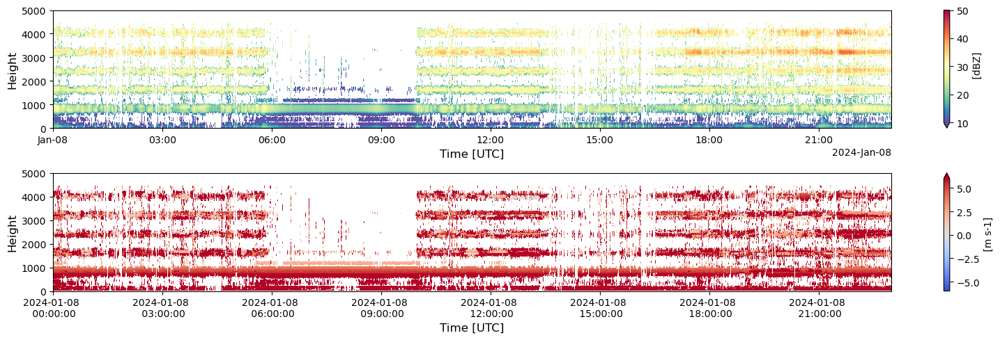

In [6]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('January 8th.png', dpi=300, bbox_inches='tight')

In [30]:
gb = ds.Zea.groupby(ds.time.dt.hour)
gb

DataArrayGroupBy, grouped over 'hour'
19 groups with labels 0, 1, 2, 3, 4, 5, ..., 17, 18, 19, 21, 22.

In [31]:
for group_name, group_da in gb:
    # stop iterating after the first loop
    break 
print(group_name)
group_da

0


<xarray.DataArray 'Zea' (time: 360, range: 128)>
dask.array<getitem, shape=(360, 128), dtype=float64, chunksize=(1, 128), chunktype=numpy.ndarray>
Coordinates:
  * range      (range) float32 0.0 35.0 70.0 ... 4.375e+03 4.41e+03 4.445e+03
  * time       (time) datetime64[ns] 2023-12-18T00:00:00.006161920 ... 2023-1...
    elevation  (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth    (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
Attributes:
    standard_name:     attenuated_equivalent_reflectivity_factor
    long_name:         
    units:             dBZ
    field_folds:       false
    fold_limit_lower:  0.0
    fold_limit_upper:  0.0
    thresholding_xml:  
    legend_xml:        
    is_discreet:       false

In [33]:
gb.map(np.mean)

<xarray.DataArray 'Zea' (hour: 19)>
dask.array<concatenate, shape=(19,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * hour     (hour) int64 0 1 2 3 4 5 6 7 8 9 10 11 13 16 17 18 19 21 22

In [34]:
sst_mm = gb.mean(dim='time')
sst_mm

<xarray.DataArray 'Zea' (hour: 19, range: 128)>
dask.array<stack, shape=(19, 128), dtype=float64, chunksize=(1, 128), chunktype=numpy.ndarray>
Coordinates:
  * range    (range) float32 0.0 35.0 70.0 ... 4.375e+03 4.41e+03 4.445e+03
  * hour     (hour) int64 0 1 2 3 4 5 6 7 8 9 10 11 13 16 17 18 19 21 22
Attributes:
    standard_name:     attenuated_equivalent_reflectivity_factor
    long_name:         
    units:             dBZ
    field_folds:       false
    fold_limit_lower:  0.0
    fold_limit_upper:  0.0
    thresholding_xml:  
    legend_xml:        
    is_discreet:       false

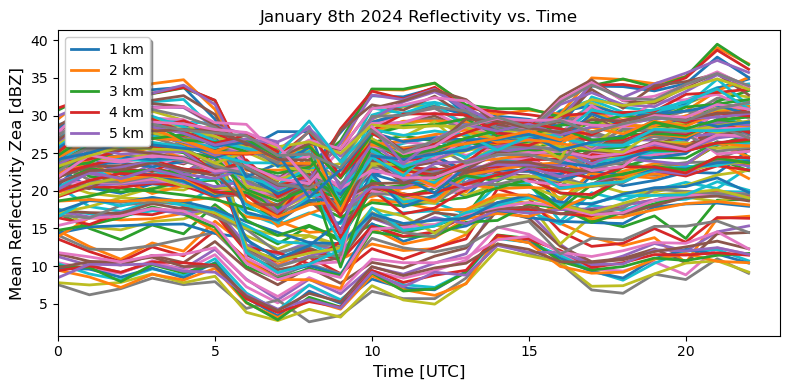

In [11]:
fig, ax = plt.subplots(figsize=(8, 4))


isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range),ds["Zea"].isel(time=isel_time),ax.plot(sst_mm, linewidth=2)



plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.title('January 8th 2024 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()

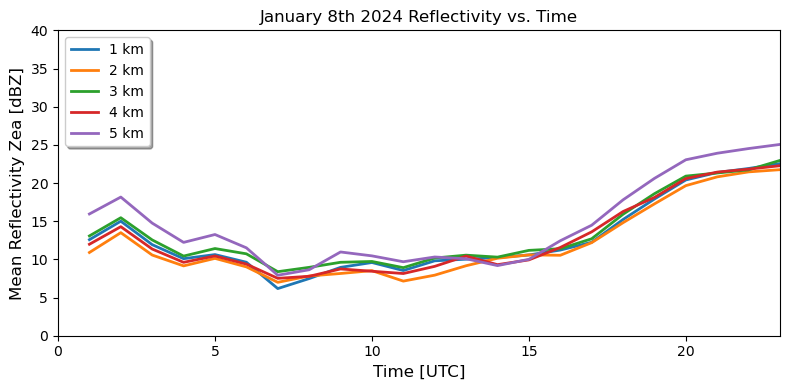

In [12]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('January 8th 2024 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('January 8th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [13]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202401/20240102/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])

In [14]:
ds

<xarray.Dataset>
Dimensions:                 (time: 7920, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2024-01-02T00:00:00.0061460...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2024-01-02T00:00:00Z' ... b'2024-0...
    time_coverage_end       (time) |S128 b'2024-01-02T00:59:50Z' ... b'2024-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

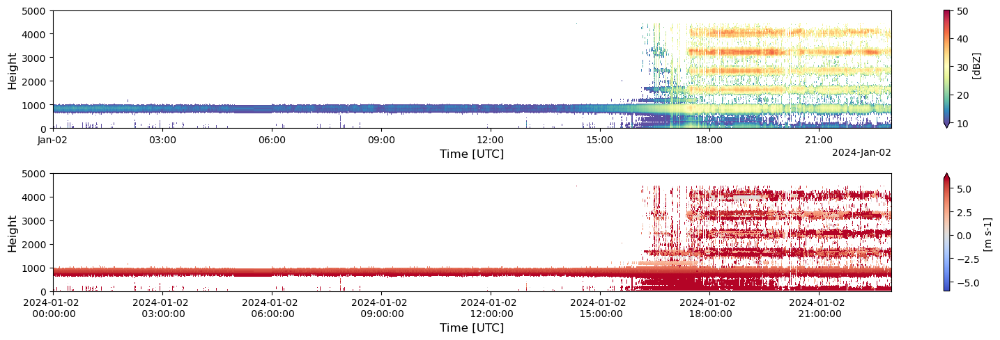

In [15]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('January 2nd.png', dpi=300, bbox_inches='tight')

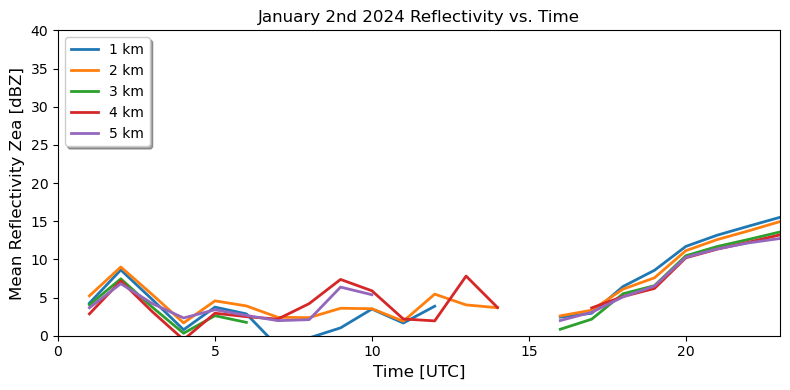

In [20]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('January 2nd 2024 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('January 2nd Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [4]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202401/20240104/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2024-01-04T00:00:00.0061532...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2024-01-04T00:00:00Z' ... b'2024-0...
    time_coverage_end       (time) |S128 b'2024-01-04T00:59:50Z' ... b'2024-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

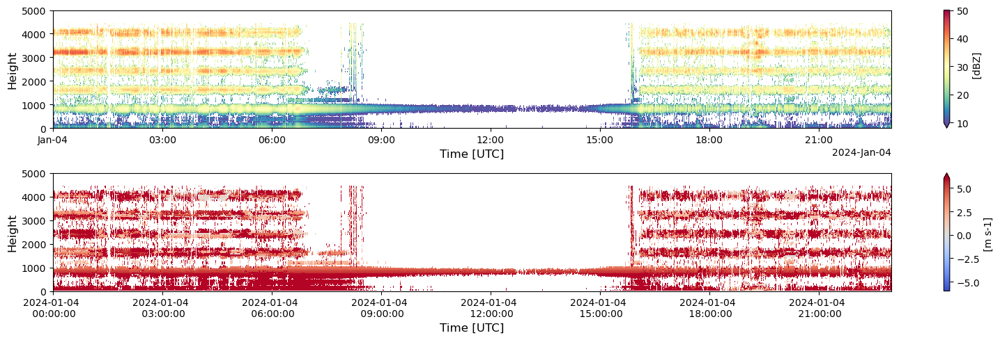

In [5]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('January 4th.png', dpi=300, bbox_inches='tight')

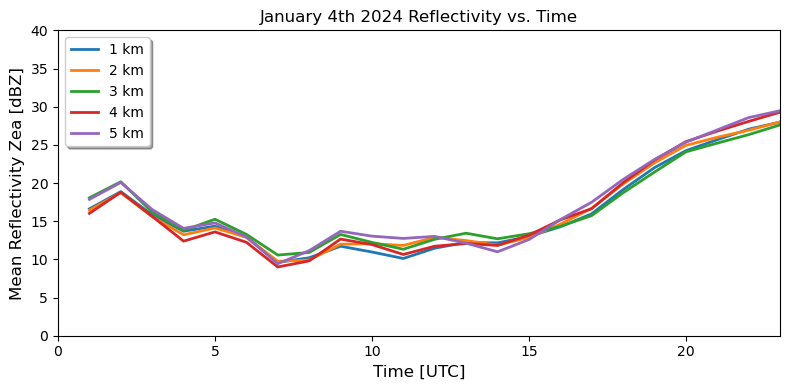

In [11]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('January 4th 2024 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('January 4th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [12]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202401/20240113/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2024-01-13T00:00:00.0061460...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2024-01-13T00:00:00Z' ... b'2024-0...
    time_coverage_end       (time) |S128 b'2024-01-13T00:59:50Z' ... b'2024-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

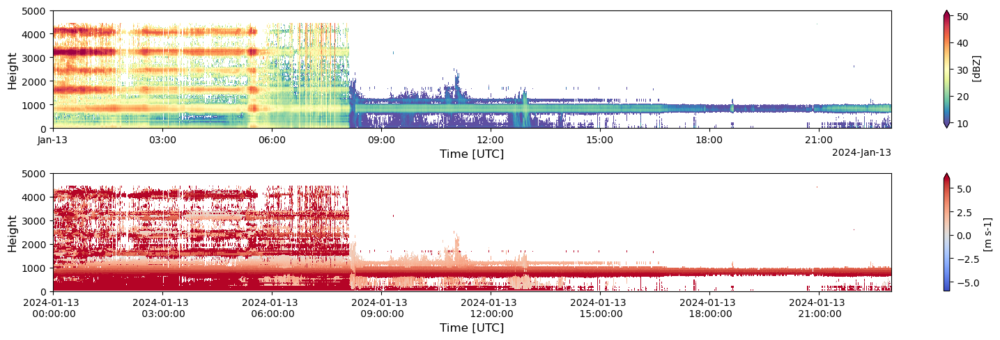

In [13]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('January 13th.png', dpi=300, bbox_inches='tight')

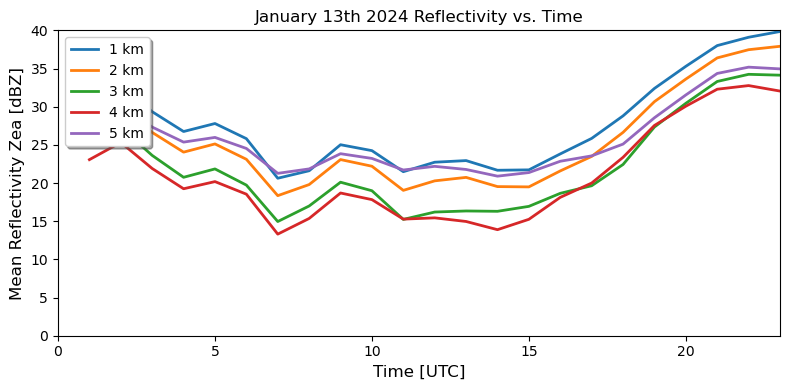

In [19]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('January 13th 2024 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('January 13th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [4]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202312/20231210/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 5400, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2023-12-10T00:00:00.0061568...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-12-10T00:00:00Z' ... b'2023-1...
    time_coverage_end       (time) |S128 b'2023-12-10T00:59:50Z' ... b'2023-1...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

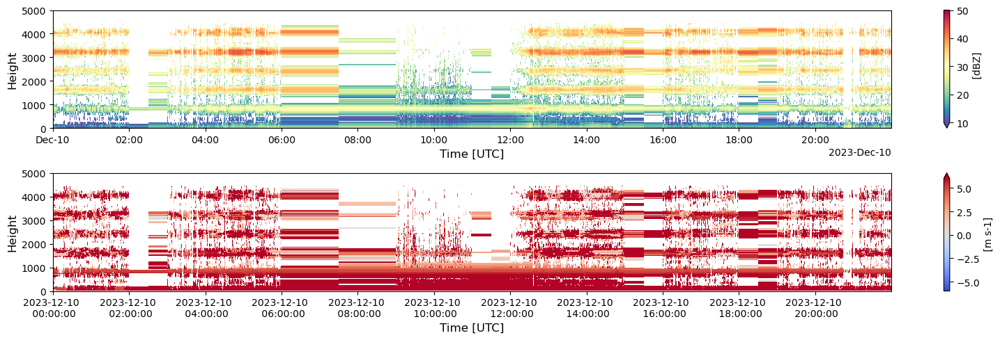

In [5]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Dec 10th.png', dpi=300, bbox_inches='tight')

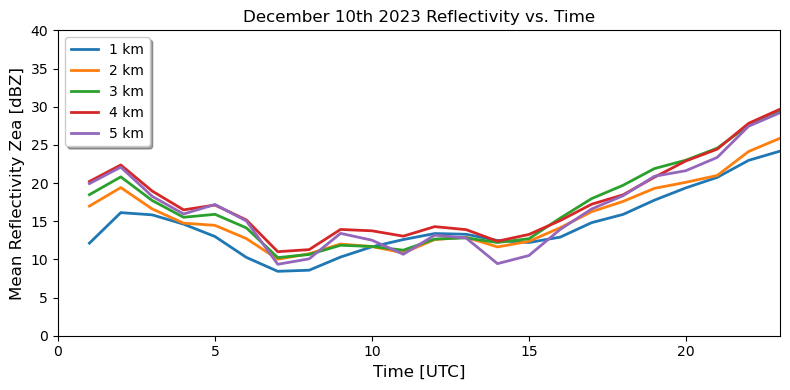

In [10]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('December 10th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('December 10th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [11]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202312/20231230/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 7920, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2023-12-30T01:00:00.0061639...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-12-30T01:00:00Z' ... b'2023-1...
    time_coverage_end       (time) |S128 b'2023-12-30T01:59:50Z' ... b'2023-1...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

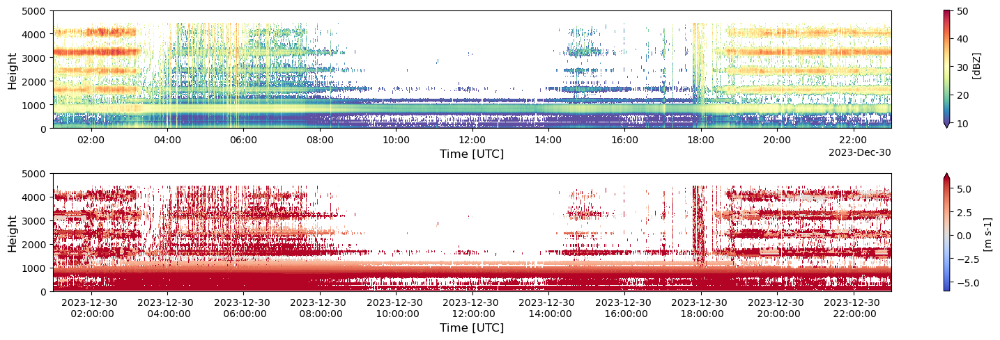

In [12]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Dec 30th.png', dpi=300, bbox_inches='tight')

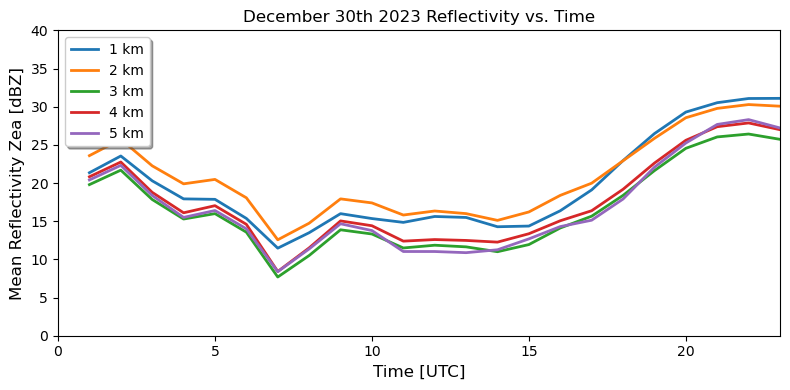

In [17]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('December 30th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('December 30th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [20]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202312/20231209/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 5919, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2023-12-09T00:00:00.0069859...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-12-09T00:00:00Z' ... b'2023-1...
    time_coverage_end       (time) |S128 b'2023-12-09T00:59:50Z' ... b'2023-1...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

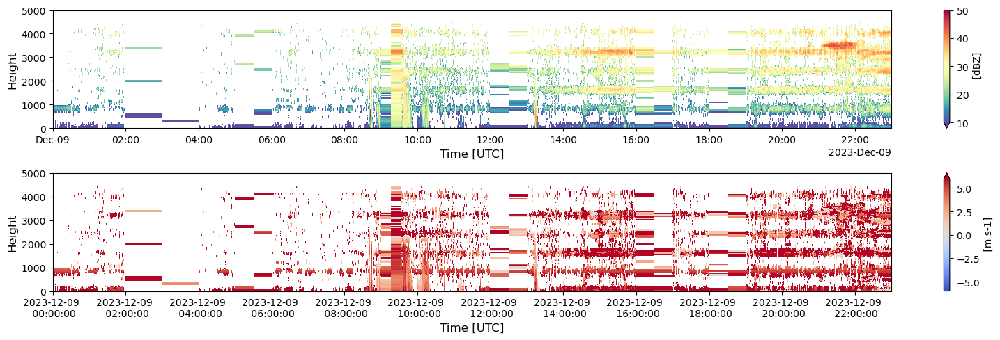

In [21]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Dec 9th.png', dpi=300, bbox_inches='tight')

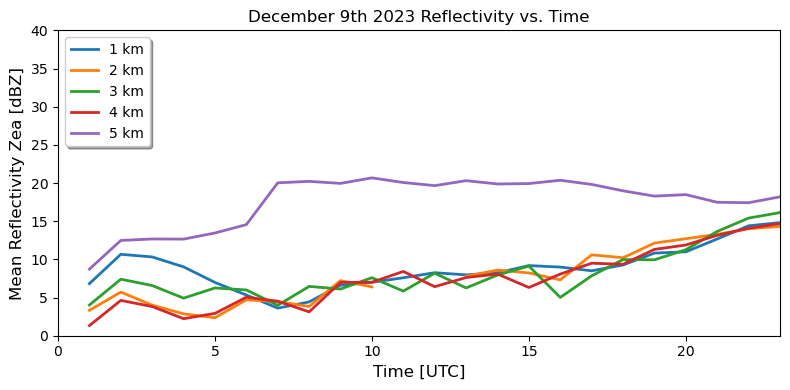

In [27]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('December 9th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('December 9th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [28]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202312/20231218/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 6840, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2023-12-18T00:00:00.0061619...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-12-18T00:00:00Z' ... b'2023-1...
    time_coverage_end       (time) |S128 b'2023-12-18T00:59:50Z' ... b'2023-1...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

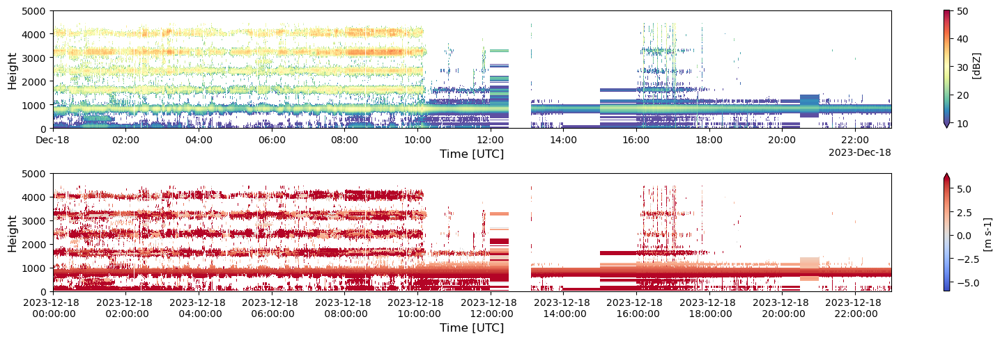

In [29]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Dec 18th.png', dpi=300, bbox_inches='tight')

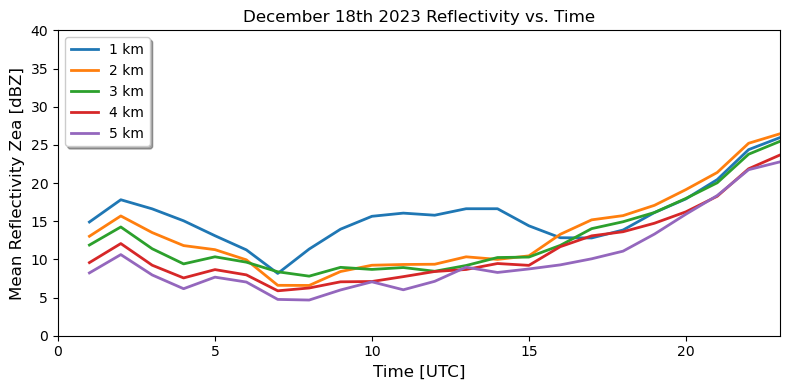

In [36]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('December 18th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('December 18th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [18]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202311/20231103/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2023-11-03T00:00:00.0069721...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-11-03T00:00:00Z' ... b'2023-1...
    time_coverage_end       (time) |S128 b'2023-11-03T00:59:50Z' ... b'2023-1...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

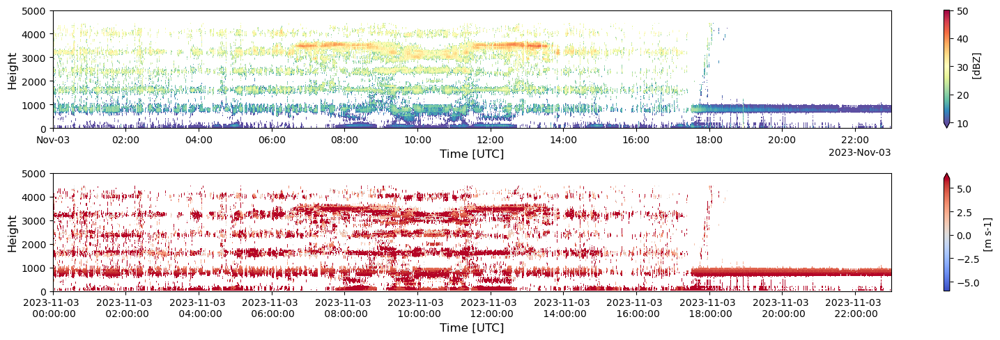

In [19]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Nov 3rd.png', dpi=300, bbox_inches='tight')

In [69]:
gb = ds.Zea.groupby(ds.time.dt.hour)
gb
for group_name, group_da in gb:
    # stop iterating after the first loop
    break 
print(group_name)
group_da

0


<xarray.DataArray 'Zea' (time: 360, range: 256)>
dask.array<getitem, shape=(360, 256), dtype=float64, chunksize=(1, 256), chunktype=numpy.ndarray>
Coordinates:
  * range      (range) float32 0.0 35.0 70.0 ... 8.855e+03 8.89e+03 8.925e+03
  * time       (time) datetime64[ns] 2023-09-28T00:00:00.009360128 ... 2023-0...
    elevation  (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth    (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
Attributes:
    standard_name:     attenuated_equivalent_reflectivity_factor
    long_name:         
    units:             dBZ
    field_folds:       false
    fold_limit_lower:  0.0
    fold_limit_upper:  0.0
    thresholding_xml:  
    legend_xml:        
    is_discreet:       false

In [70]:
gb.map(np.mean)
sst_mm = gb.mean(dim='time')
sst_mm

<xarray.DataArray 'Zea' (hour: 23, range: 256)>
dask.array<stack, shape=(23, 256), dtype=float64, chunksize=(1, 256), chunktype=numpy.ndarray>
Coordinates:
  * range    (range) float32 0.0 35.0 70.0 ... 8.855e+03 8.89e+03 8.925e+03
  * hour     (hour) int64 0 1 2 3 4 5 6 7 8 9 ... 13 14 15 16 17 18 19 20 21 22
Attributes:
    standard_name:     attenuated_equivalent_reflectivity_factor
    long_name:         
    units:             dBZ
    field_folds:       false
    fold_limit_lower:  0.0
    fold_limit_upper:  0.0
    thresholding_xml:  
    legend_xml:        
    is_discreet:       false

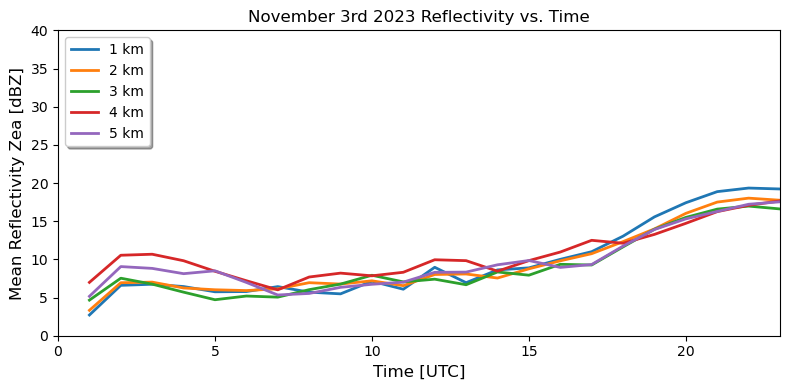

In [22]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('November 3rd 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('November 3rd Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [23]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202311/20231116/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 6120, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2023-11-16T01:00:00.0069611...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-11-16T01:00:00Z' ... b'2023-1...
    time_coverage_end       (time) |S128 b'2023-11-16T01:59:50Z' ... b'2023-1...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

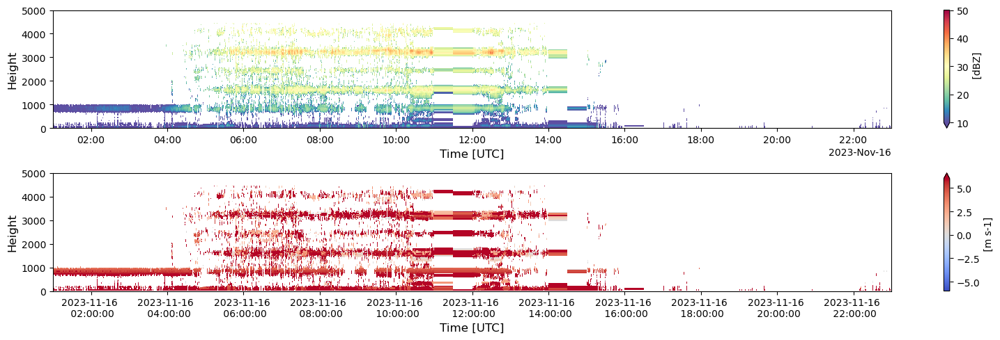

In [24]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Nov 16th.png', dpi=300, bbox_inches='tight')

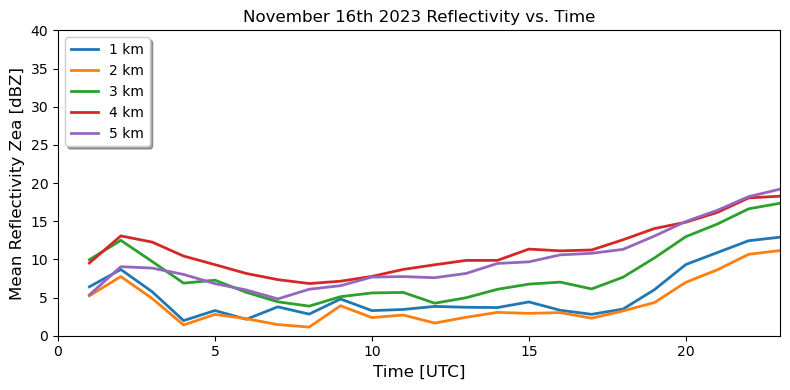

In [27]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('November 16th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('November 16th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [37]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202311/20231107/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2023-11-07T00:00:00.0069621...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-11-07T00:00:00Z' ... b'2023-1...
    time_coverage_end       (time) |S128 b'2023-11-07T00:59:50Z' ... b'2023-1...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

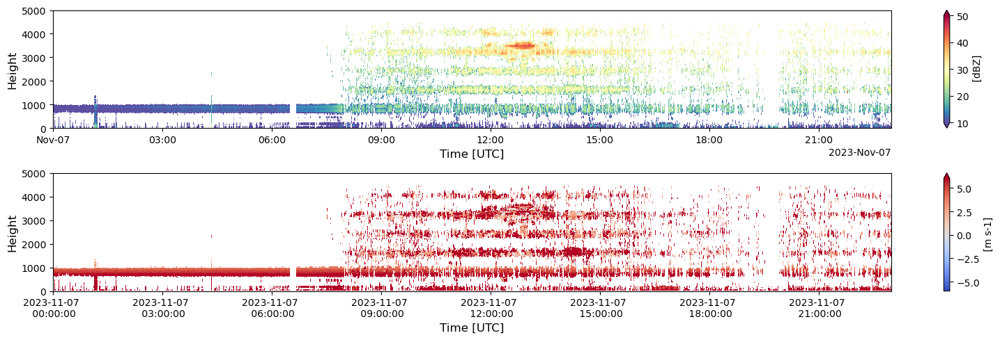

In [38]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Nov 7th.png', dpi=300, bbox_inches='tight')

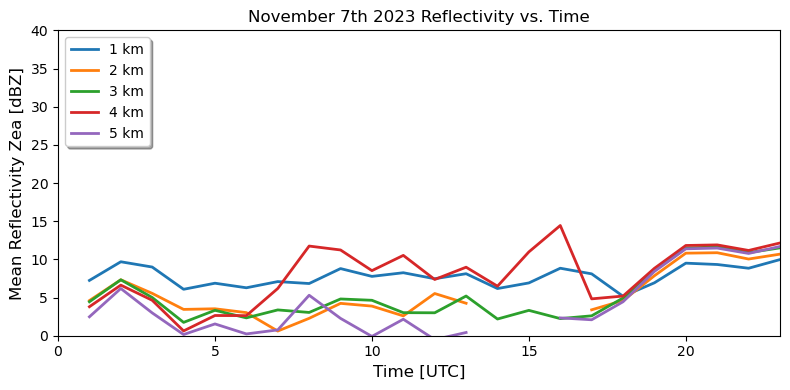

In [42]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('November 7th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('November 7th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [43]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202311/20231120/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 6480, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2023-11-20T00:00:00.0069560...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-11-20T00:00:00Z' ... b'2023-1...
    time_coverage_end       (time) |S128 b'2023-11-20T00:59:50Z' ... b'2023-1...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

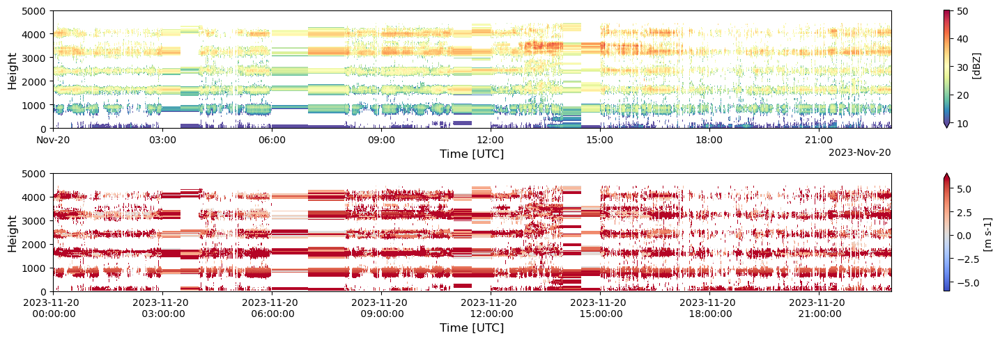

In [44]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Nov 20th.png', dpi=300, bbox_inches='tight')

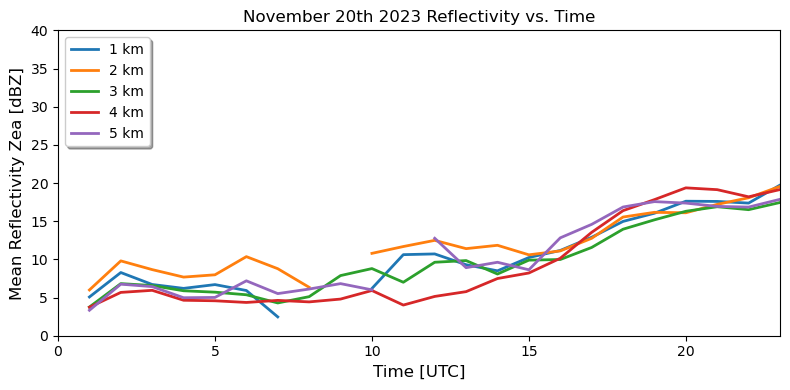

In [48]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('November 20th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('November 20th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [28]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202310/20231011/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2023-10-11T00:00:00.0075709...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-10-11T00:00:00Z' ... b'2023-1...
    time_coverage_end       (time) |S128 b'2023-10-11T00:59:50Z' ... b'2023-1...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

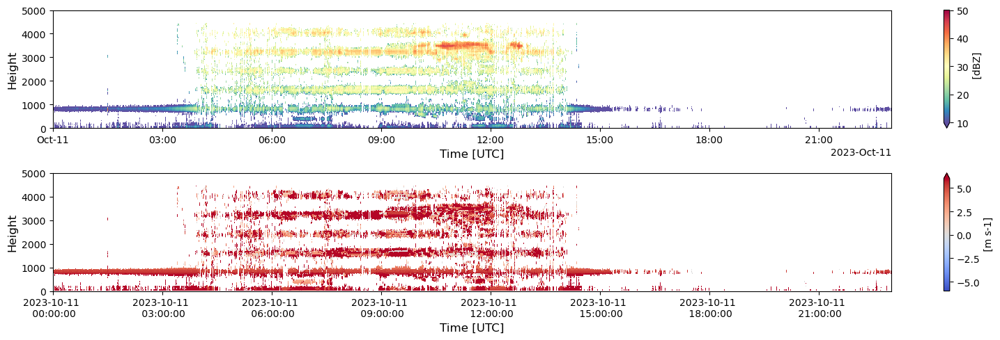

In [29]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Oct 11th.png', dpi=300, bbox_inches='tight')

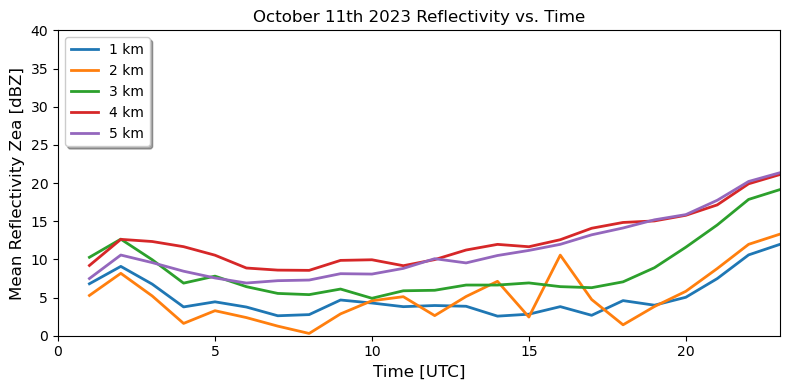

In [32]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('October 11th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('October 11th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [33]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202310/20231021/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2023-10-21T00:00:00.0069649...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-10-21T00:00:00Z' ... b'2023-1...
    time_coverage_end       (time) |S128 b'2023-10-21T00:59:50Z' ... b'2023-1...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

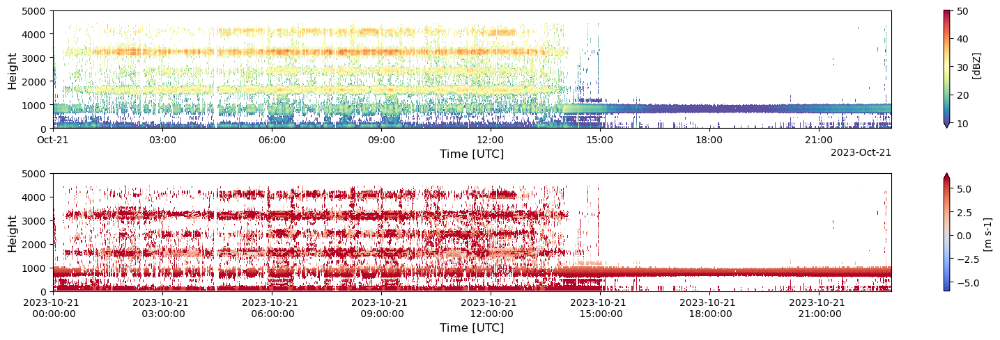

In [34]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Oct 21st.png', dpi=300, bbox_inches='tight')

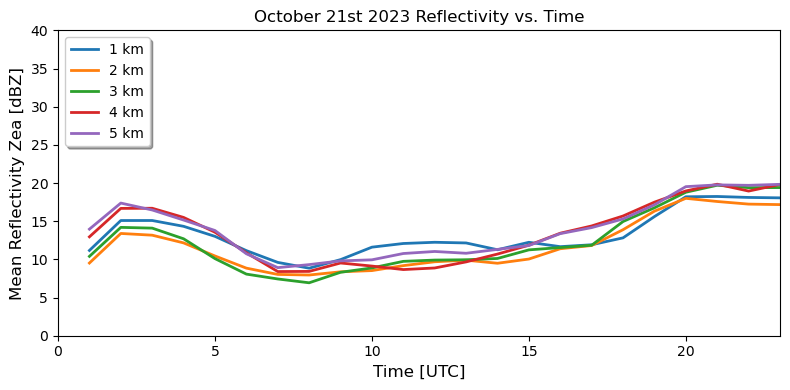

In [37]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('October 21st 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('October 21st Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [49]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202310/20231016/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2023-10-16T00:00:00.0075760...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-10-16T00:00:00Z' ... b'2023-1...
    time_coverage_end       (time) |S128 b'2023-10-16T00:59:50Z' ... b'2023-1...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

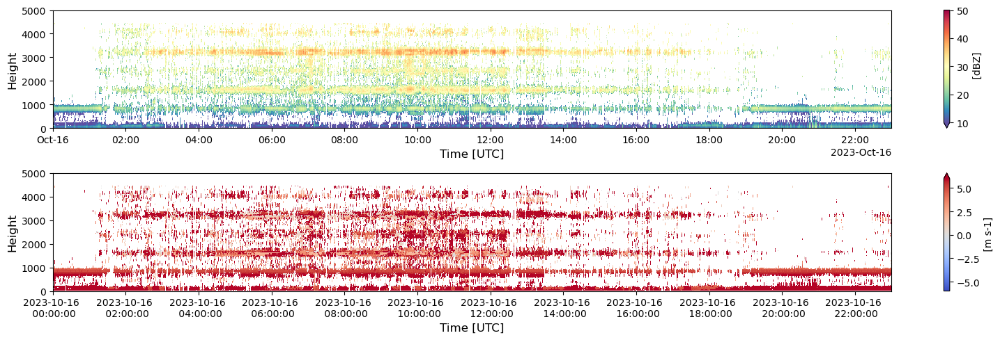

In [50]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Oct 16th.png', dpi=300, bbox_inches='tight')

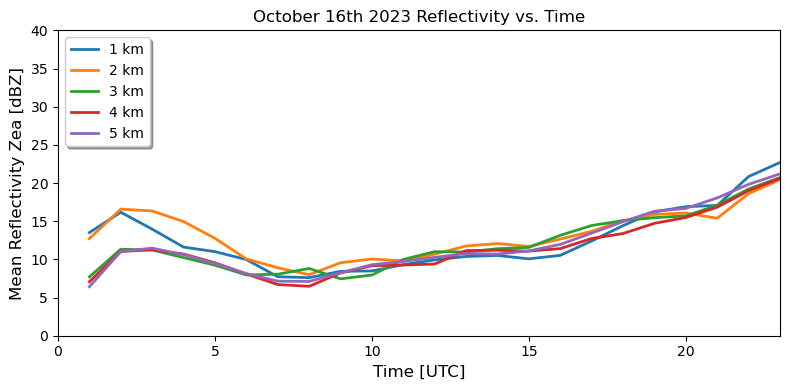

In [54]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('October 16th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('October 16th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [55]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202310/20231030/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 128, sweep: 1, n_spectra: 128,
                             spectrum_n_samples: 64)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 4.41e+03 4.445e+03
  * time                    (time) datetime64[ns] 2023-10-30T00:00:00.0069660...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 4.41e+03 4.445e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-10-30T00:00:00Z' ... b'2023-1...
    time_coverage_end       (time) |S128 b'2023-10-30T00:59:50Z' ... b'2023-1...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 128), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 128), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 128), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 128, 64), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 128, 64), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

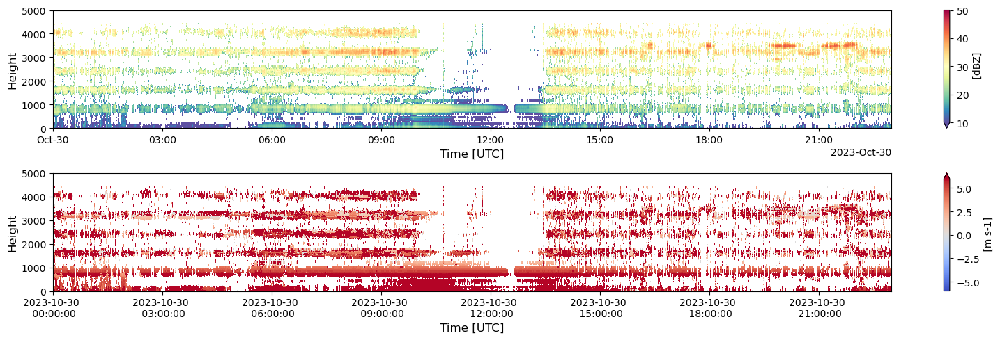

In [56]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Oct 30th.png', dpi=300, bbox_inches='tight')

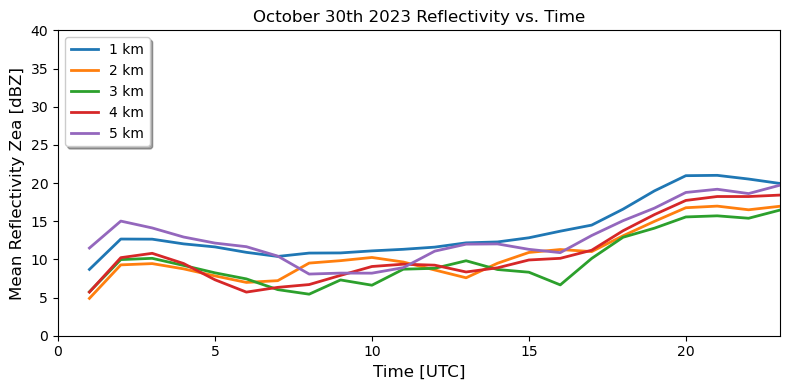

In [60]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('October 30th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('October 30th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [38]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202309/20230923/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-09-23T00:00:00.0093911...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-09-23T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-09-23T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

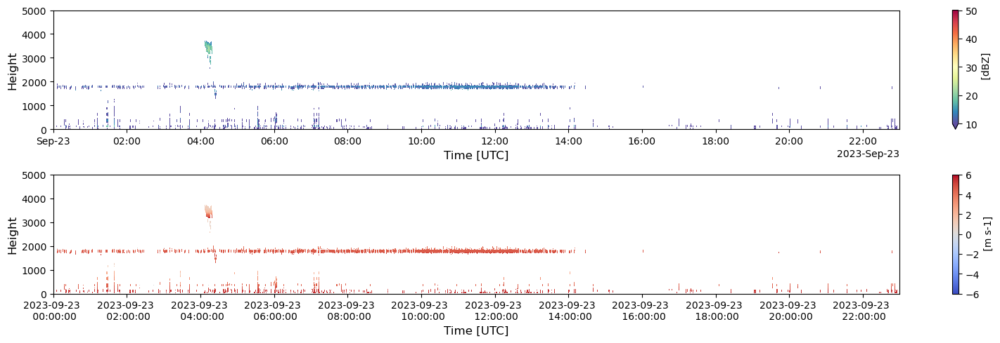

In [39]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Sept 23rd.png', dpi=300, bbox_inches='tight')

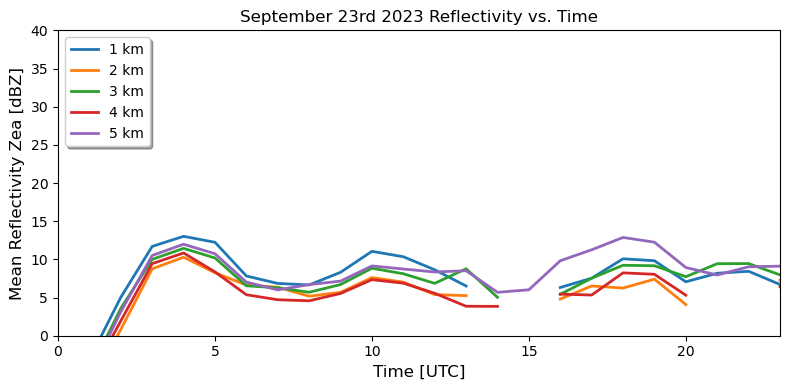

In [42]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('September 23rd 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('September 23rd Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [43]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202309/20230909/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-09-09T00:00:00.0093739...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-09-09T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-09-09T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

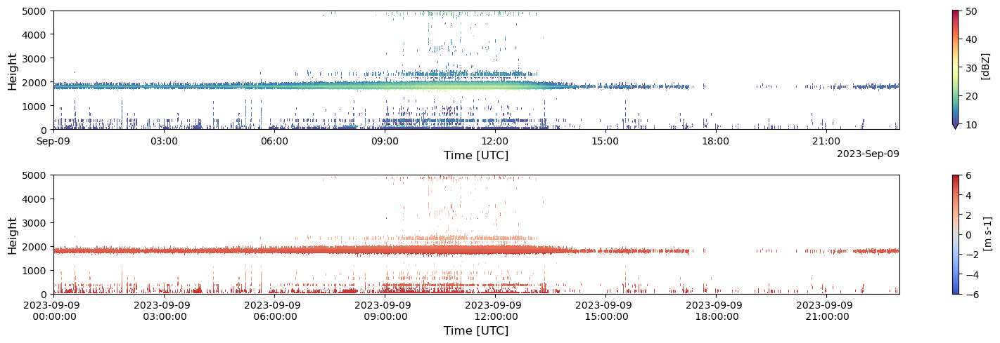

In [44]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Sept 9th.png', dpi=300, bbox_inches='tight')

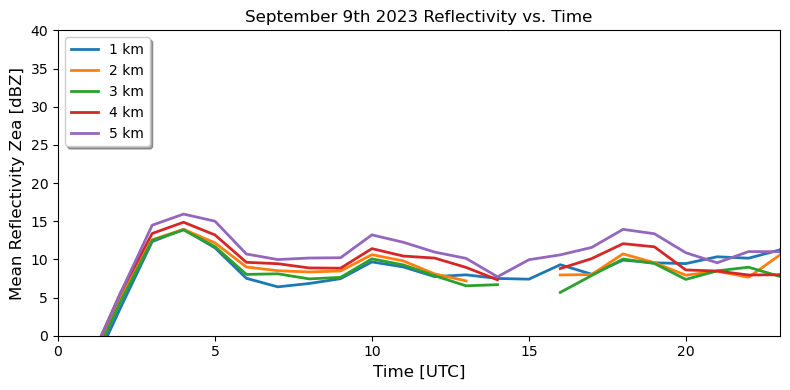

In [47]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('September 9th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('September 9th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [61]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202309/20230910/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-09-10T00:00:00.0093870...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-09-10T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-09-10T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

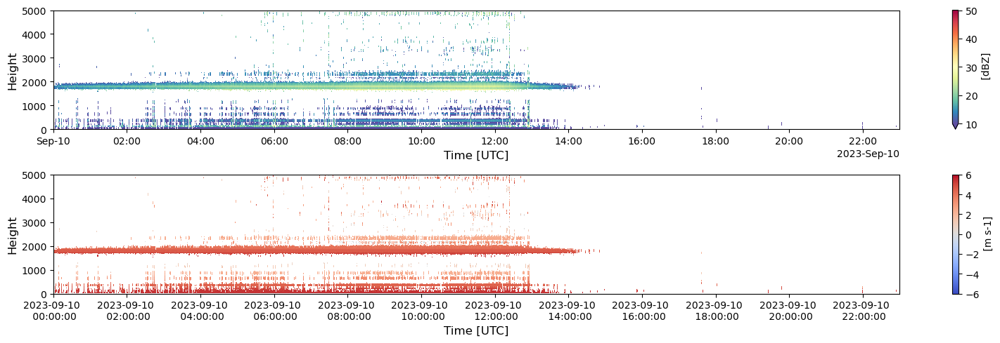

In [62]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Sept 10th.png', dpi=300, bbox_inches='tight')

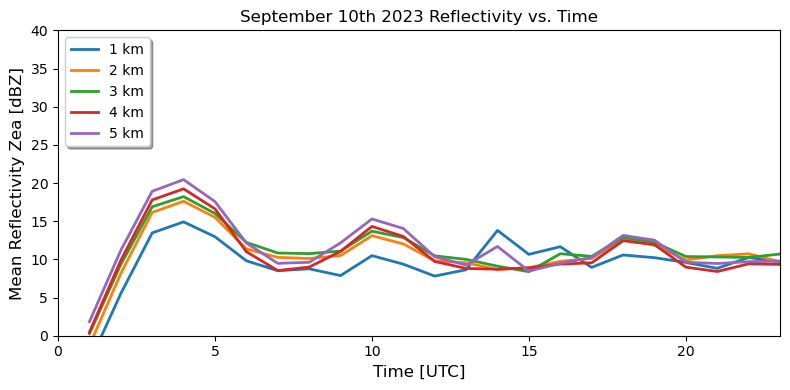

In [66]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('September 10th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('September 10th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [67]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202309/20230928/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-09-28T00:00:00.0093601...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-09-28T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-09-28T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

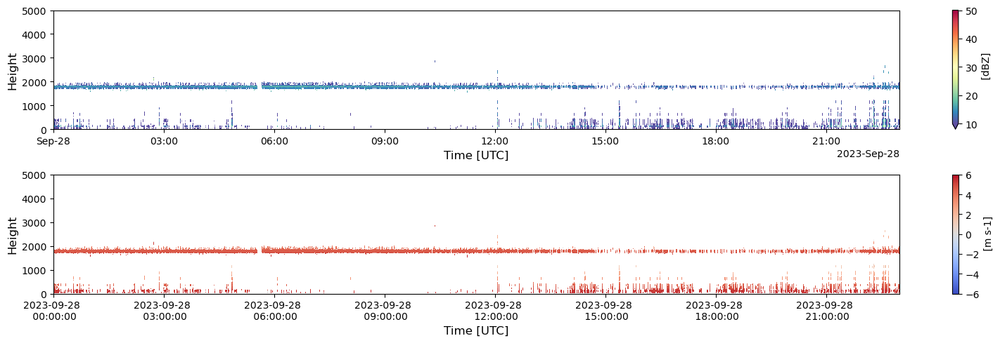

In [68]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('Sept 28th.png', dpi=300, bbox_inches='tight')

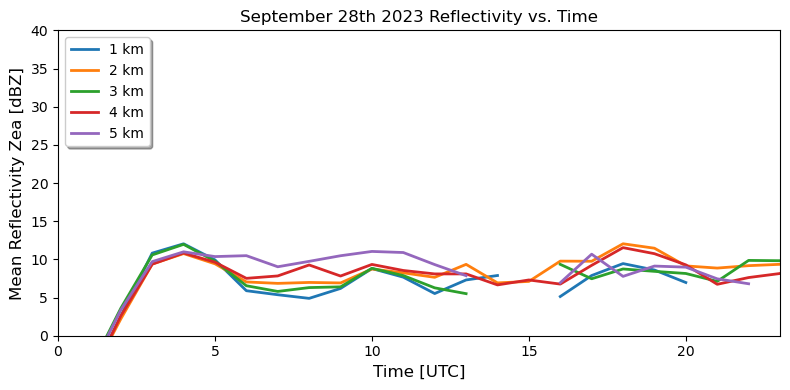

In [72]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('September 28th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('September 28th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [48]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202308/20230803/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-08-03T00:00:00.0091420...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-08-03T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-08-03T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

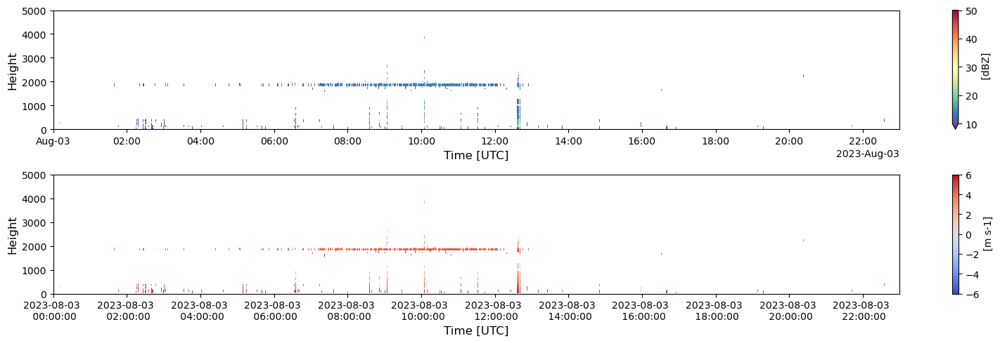

In [49]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('August 3rd.png', dpi=300, bbox_inches='tight')

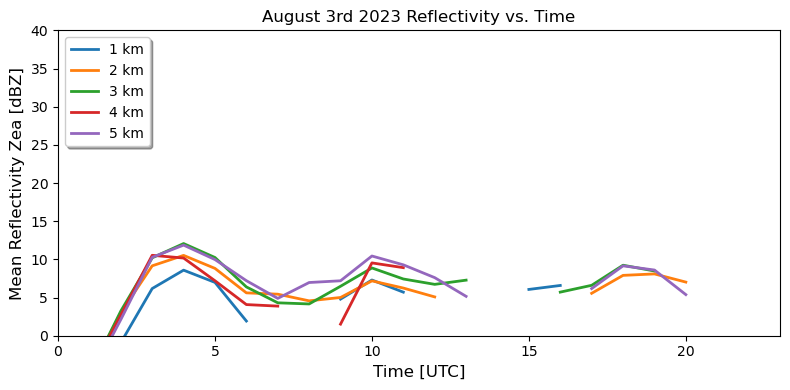

In [52]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('August 3rd 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('August 3rd Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [53]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202308/20230816/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-08-16T00:00:00.0091358...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-08-16T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-08-16T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

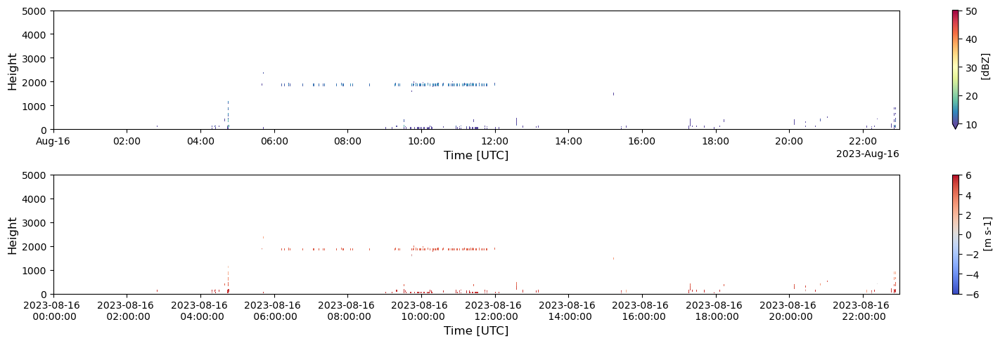

In [54]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('August 16th.png', dpi=300, bbox_inches='tight')

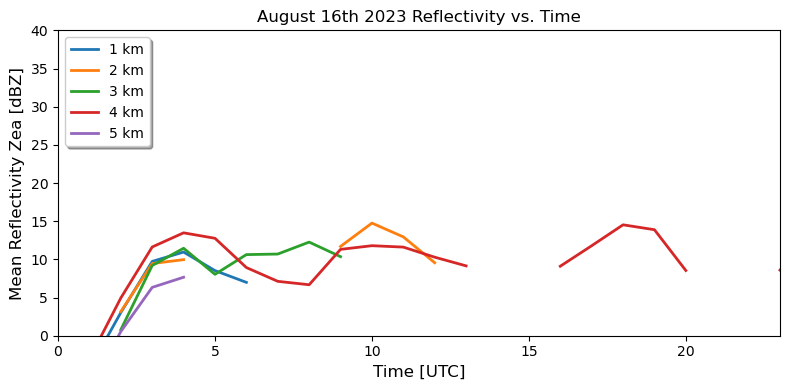

In [57]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('August 16th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('August 16th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [73]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202308/20230808/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-08-08T00:00:00.0091230...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-08-08T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-08-08T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

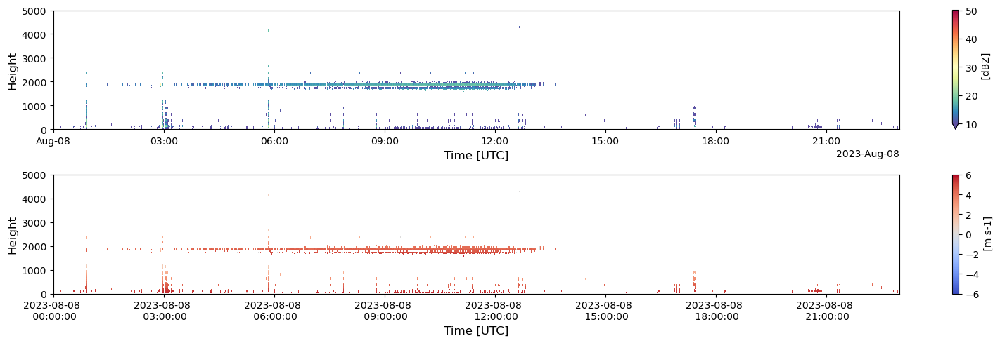

In [74]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('August 8th.png', dpi=300, bbox_inches='tight')

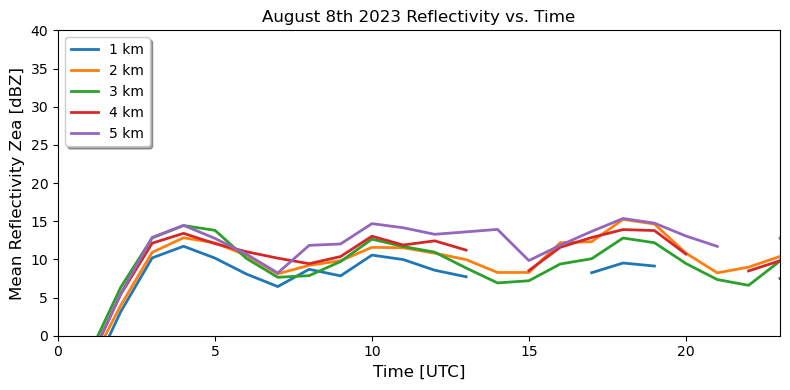

In [78]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('August 8th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('August 8th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [79]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202308/20230822/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-08-22T00:00:00.0091258...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-08-22T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-08-22T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

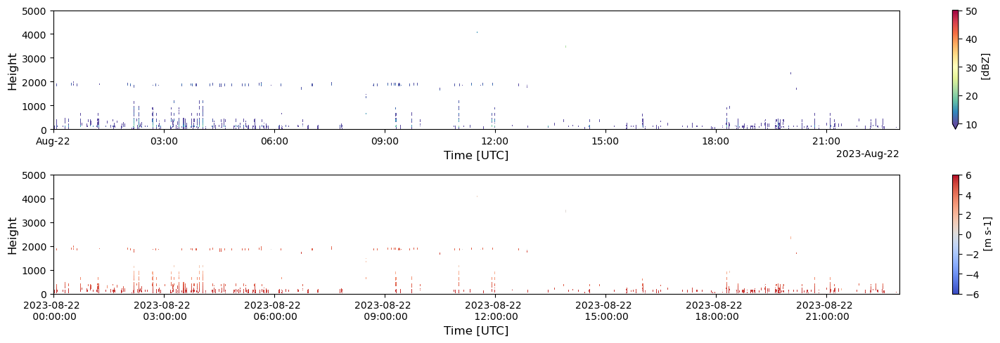

In [80]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('August 22nd.png', dpi=300, bbox_inches='tight')

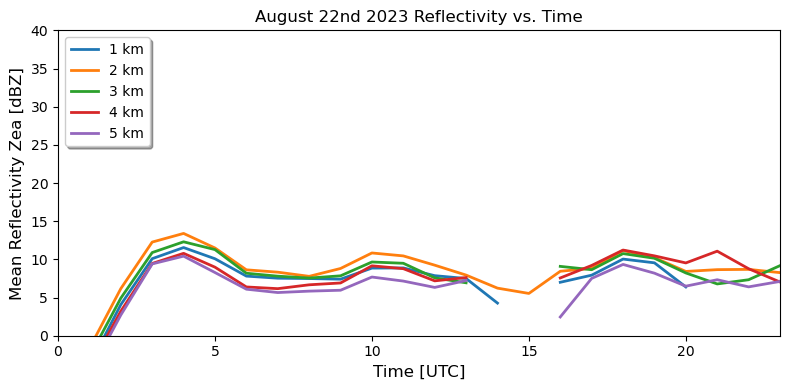

In [84]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('August 22nd 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('August 22nd Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [126]:
gb = ds.Zea.groupby(ds.time.dt.hour)
gb
for group_name, group_da in gb:
    # stop iterating after the first loop
    break 
print(group_name)
group_da

0


<xarray.DataArray 'Zea' (time: 360, range: 256)>
dask.array<getitem, shape=(360, 256), dtype=float64, chunksize=(1, 256), chunktype=numpy.ndarray>
Coordinates:
  * range      (range) float32 0.0 35.0 70.0 ... 8.855e+03 8.89e+03 8.925e+03
  * time       (time) datetime64[ns] 2023-05-24T00:00:00.006578944 ... 2023-0...
    elevation  (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth    (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
Attributes:
    standard_name:     attenuated_equivalent_reflectivity_factor
    long_name:         
    units:             dBZ
    field_folds:       false
    fold_limit_lower:  0.0
    fold_limit_upper:  0.0
    thresholding_xml:  
    legend_xml:        
    is_discreet:       false

In [127]:
gb.map(np.mean)
sst_mm = gb.mean(dim='time')
sst_mm

<xarray.DataArray 'Zea' (hour: 24, range: 256)>
dask.array<stack, shape=(24, 256), dtype=float64, chunksize=(1, 256), chunktype=numpy.ndarray>
Coordinates:
  * range    (range) float32 0.0 35.0 70.0 ... 8.855e+03 8.89e+03 8.925e+03
  * hour     (hour) int64 0 1 2 3 4 5 6 7 8 9 ... 14 15 16 17 18 19 20 21 22 23
Attributes:
    standard_name:     attenuated_equivalent_reflectivity_factor
    long_name:         
    units:             dBZ
    field_folds:       false
    fold_limit_lower:  0.0
    fold_limit_upper:  0.0
    thresholding_xml:  
    legend_xml:        
    is_discreet:       false

In [58]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202307/20230712/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 2065, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-07-12T11:00:00.0027310...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-07-12T11:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-07-12T11:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

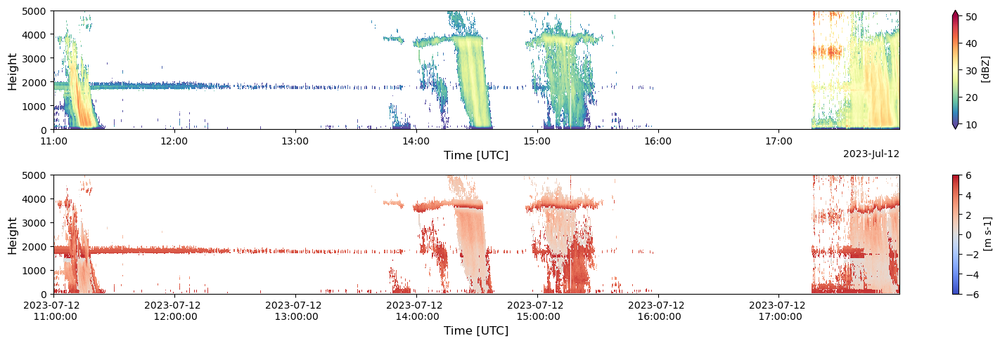

In [59]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('July 12th.png', dpi=300, bbox_inches='tight')

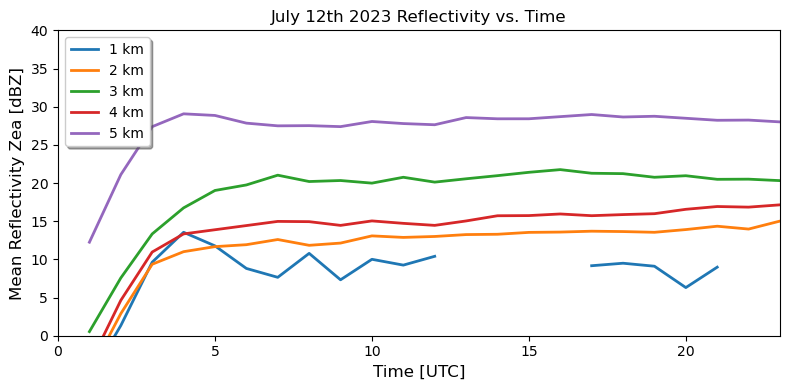

In [62]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('July 12th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('July 12th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [63]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202307/20230720/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-07-20T00:00:00.0091479...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-07-20T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-07-20T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

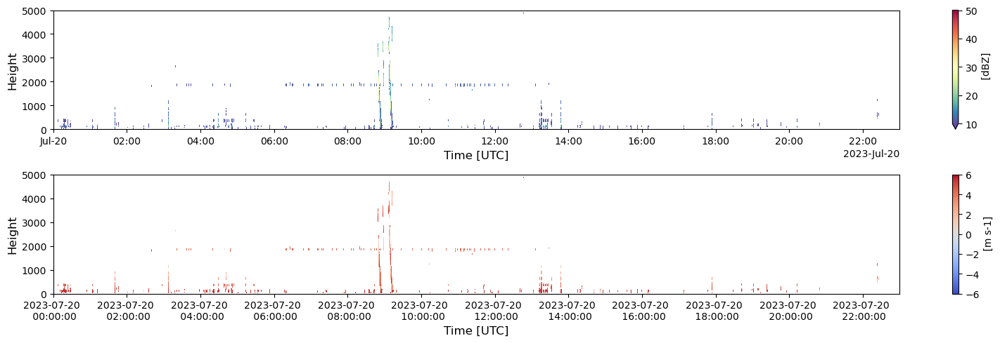

In [64]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('July 20th.png', dpi=300, bbox_inches='tight')

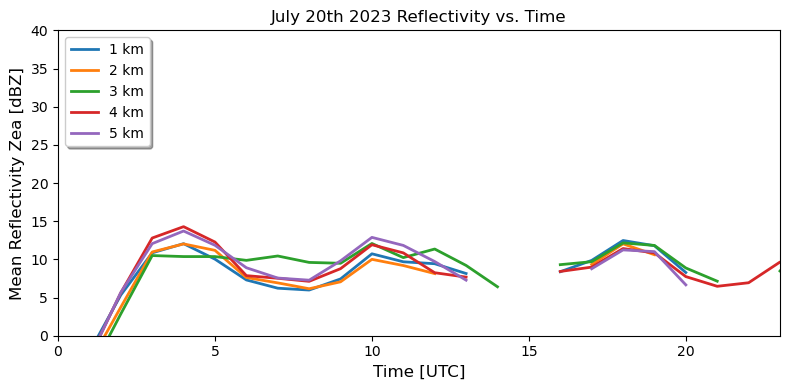

In [67]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('July 20th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('July 20th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [94]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202307/20230716/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-07-16T00:00:00.0067041...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-07-16T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-07-16T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

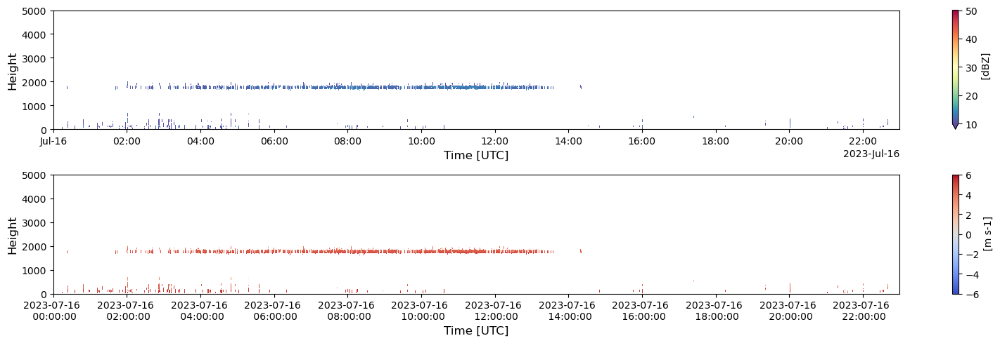

In [95]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('July 16th.png', dpi=300, bbox_inches='tight')

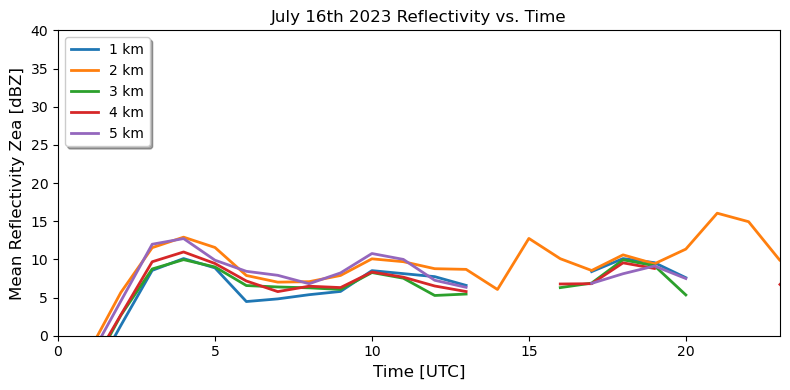

In [99]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('July 16th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('July 16th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [100]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202307/20230727/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8280, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-07-27T00:00:00.0091399...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-07-27T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-07-27T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

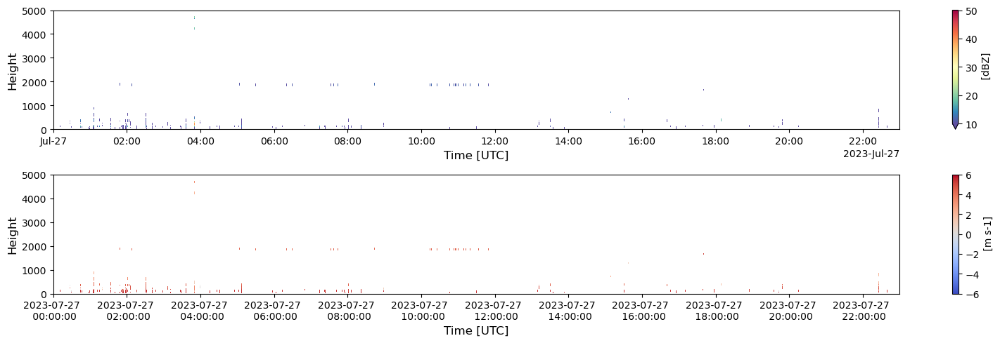

In [101]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('July 27th.png', dpi=300, bbox_inches='tight')

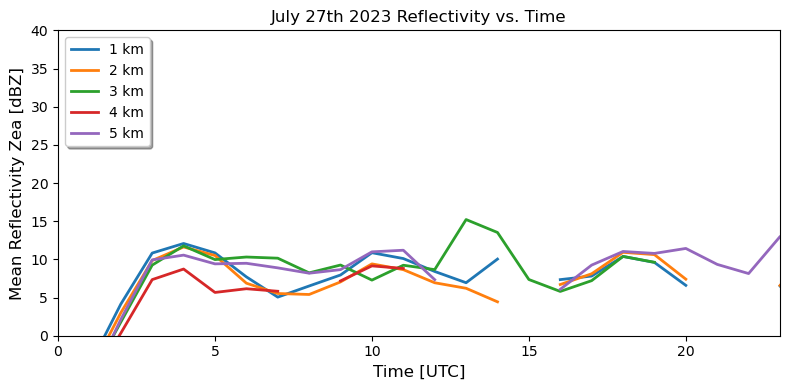

In [105]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('July 27th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('July 27th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [68]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202306/20230628/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8640, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-06-28T00:00:00.0010890...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-06-28T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-06-28T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

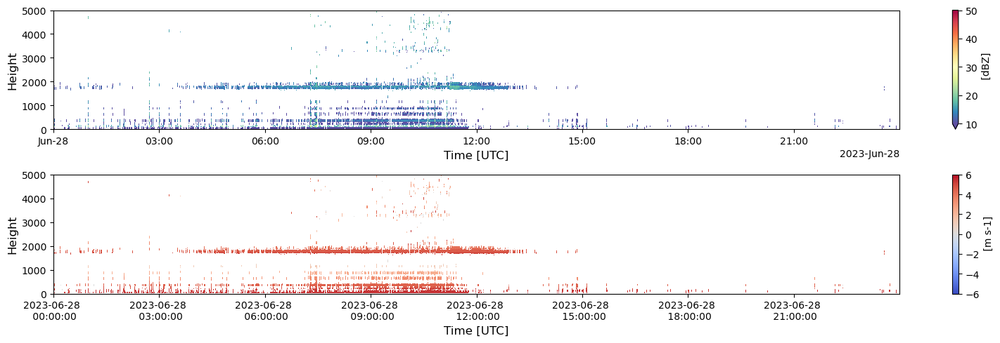

In [69]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('June 28th.png', dpi=300, bbox_inches='tight')

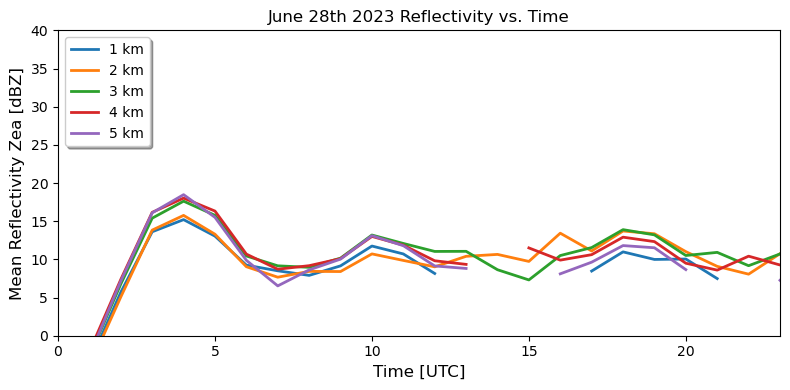

In [72]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('June 28th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('June 28th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [73]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202306/20230609/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8640, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-06-09T00:00:00.0010841...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-06-09T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-06-09T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

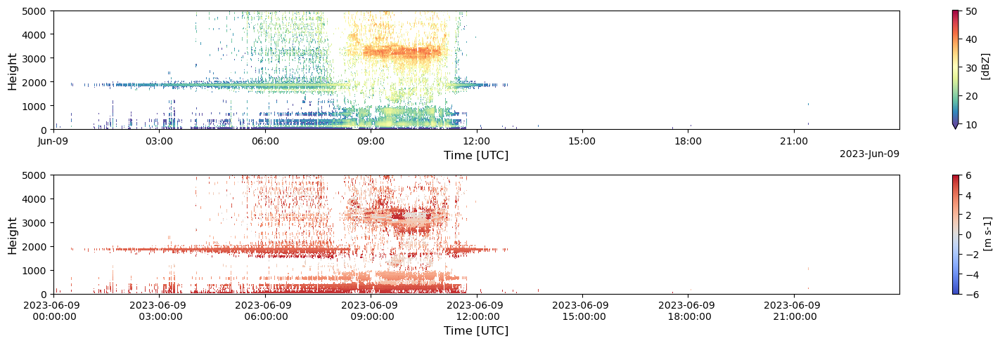

In [74]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('June 9th.png', dpi=300, bbox_inches='tight')

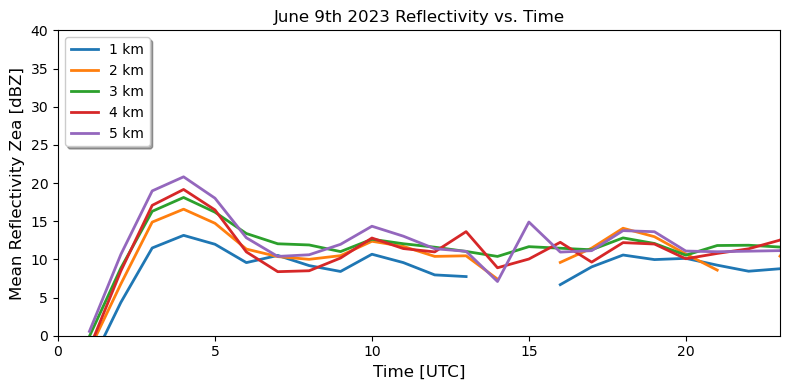

In [77]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('June 9th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('June 9th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [106]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202306/20230626/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 2520, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-06-26T17:00:00.0010869...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-06-26T17:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-06-26T17:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

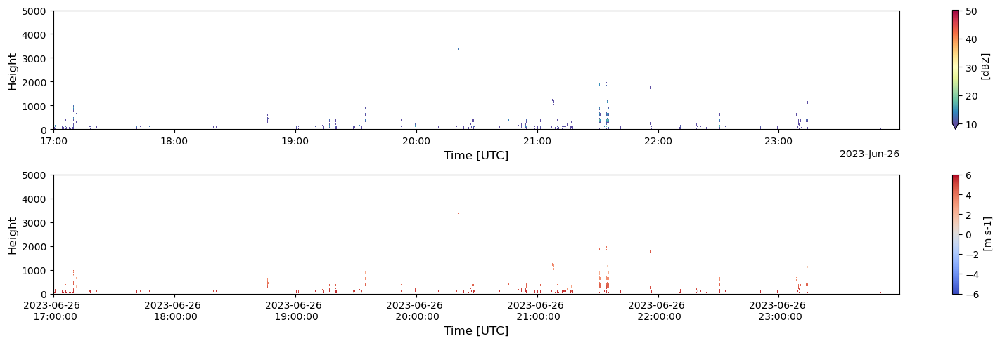

In [107]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('June 26th.png', dpi=300, bbox_inches='tight')

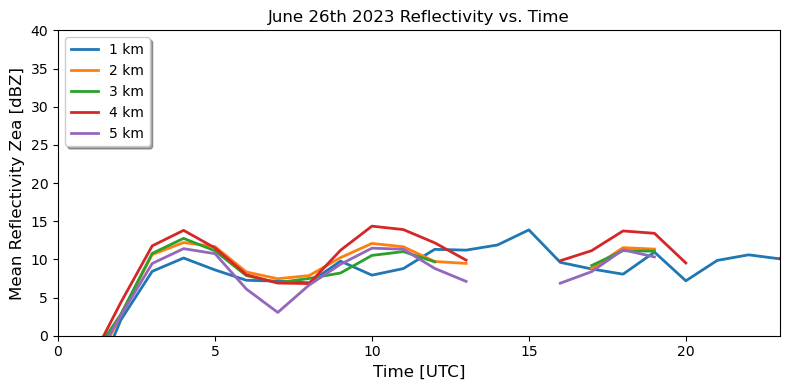

In [111]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('June 26th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('June 26th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [112]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202306/20230611/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8640, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-06-11T00:00:00.0010780...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-06-11T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-06-11T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

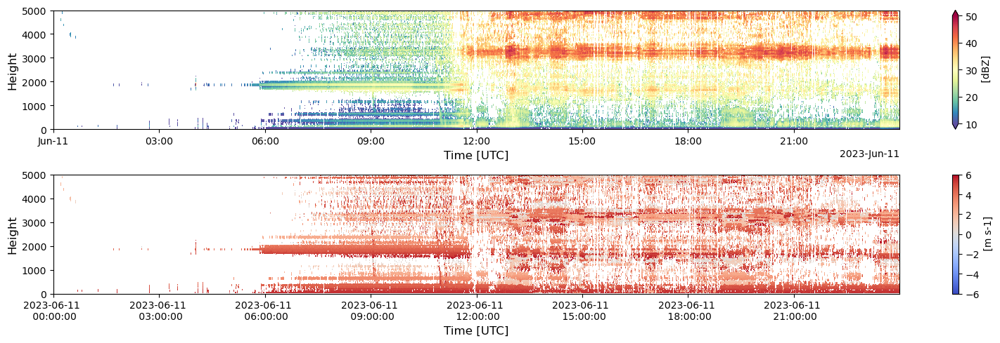

In [113]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('June 11th.png', dpi=300, bbox_inches='tight')

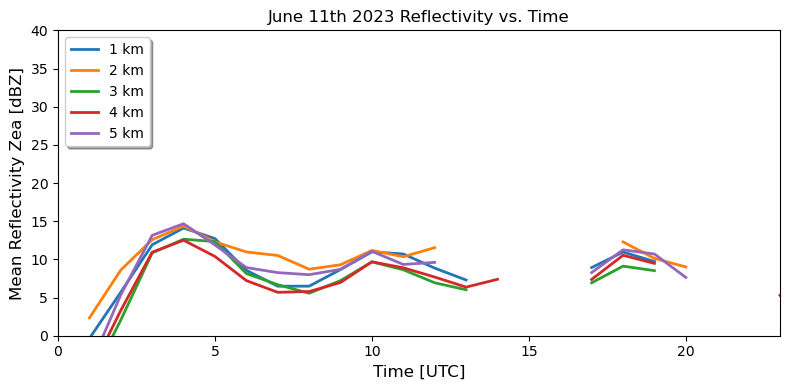

In [117]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('June 11th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('June 11th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [78]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202305/20230527/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8401, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-05-27T00:00:00.0065689...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-05-27T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-05-27T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

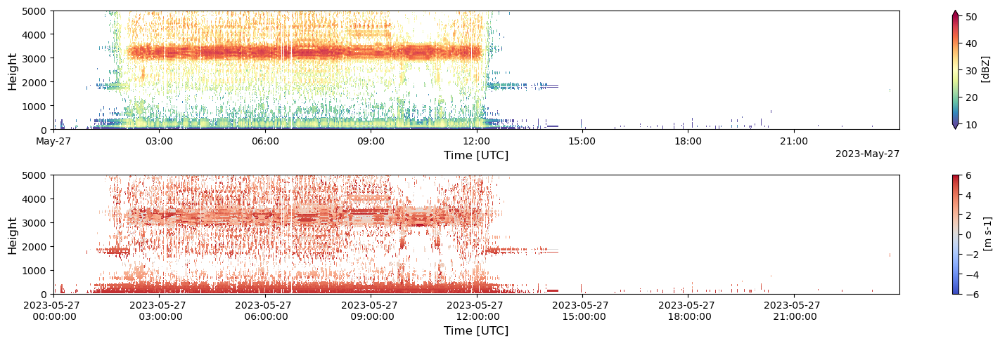

In [79]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('May 27th.png', dpi=300, bbox_inches='tight')

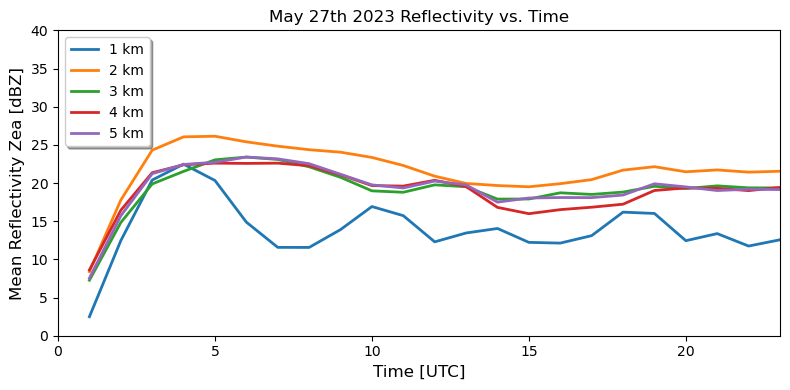

In [82]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('May 27th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('May 27th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [83]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202305/20230522/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8640, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-05-22T00:00:00.0065661...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-05-22T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-05-22T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

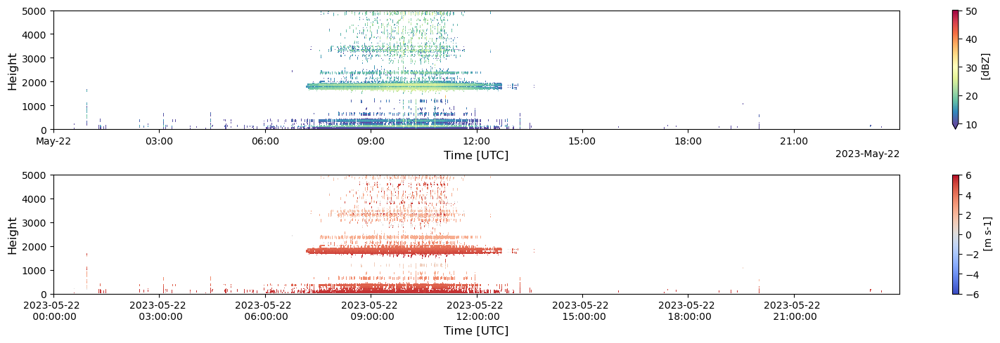

In [84]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('May 22nd.png', dpi=300, bbox_inches='tight')

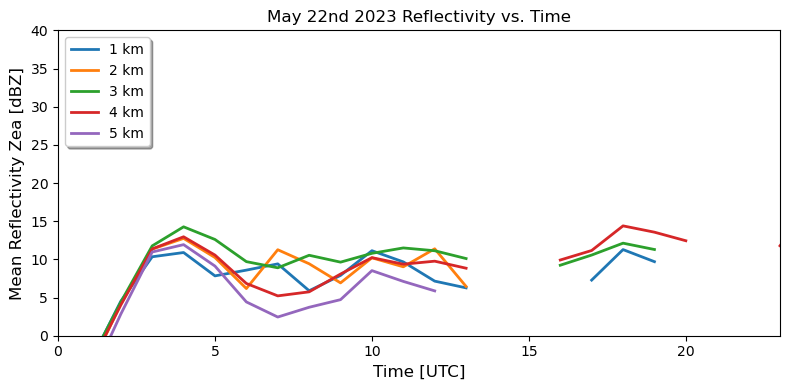

In [87]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('May 22nd 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('May 22nd Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [118]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202305/20230520/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8640, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-05-20T00:00:00.0065510...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-05-20T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-05-20T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

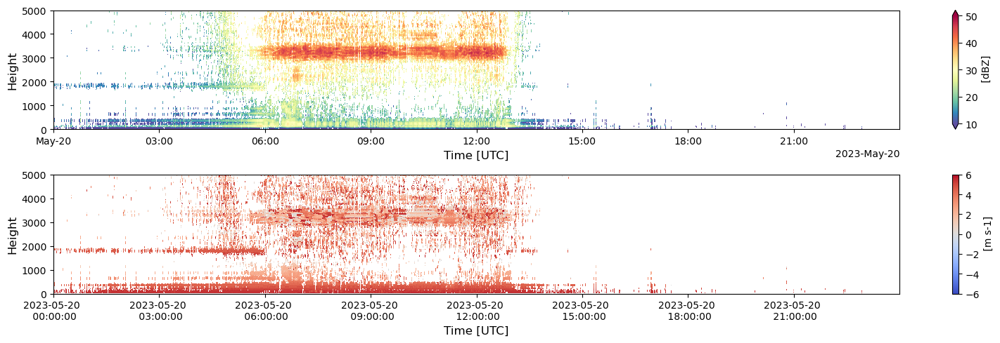

In [119]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('May 20th.png', dpi=300, bbox_inches='tight')

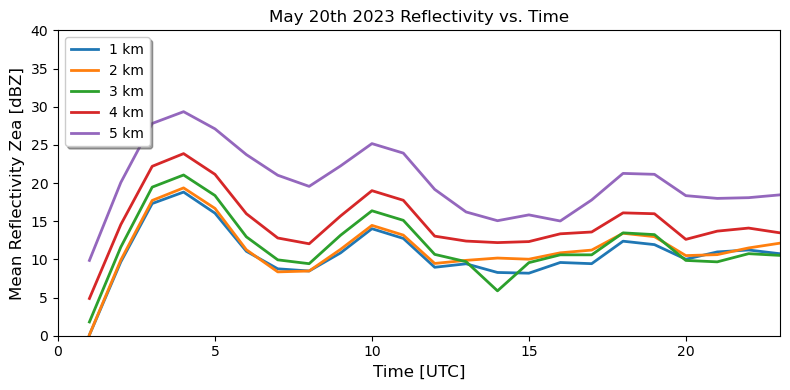

In [123]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('May 20th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('May 20th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [124]:
ds = xr.open_mfdataset('/nfs/gce/projects/crocus/data/early_in_project_ingested_data/neiu-mrrpro/202305/20230524/*.nc')
ds['range_spectra'] = (['n_spectra'], ds['range'].values)
ds = ds.set_coords(['range_spectra'])
ds

<xarray.Dataset>
Dimensions:                 (time: 8640, range: 256, sweep: 1, n_spectra: 256,
                             spectrum_n_samples: 32)
Coordinates:
  * range                   (range) float32 0.0 35.0 70.0 ... 8.89e+03 8.925e+03
  * time                    (time) datetime64[ns] 2023-05-24T00:00:00.0065789...
    elevation               (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    azimuth                 (time) float32 dask.array<chunksize=(360,), meta=np.ndarray>
    range_spectra           (n_spectra) float32 0.0 35.0 ... 8.89e+03 8.925e+03
Dimensions without coordinates: sweep, n_spectra, spectrum_n_samples
Data variables: (12/31)
    volume_number           (time) int32 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    time_coverage_start     (time) |S128 b'2023-05-24T00:00:00Z' ... b'2023-0...
    time_coverage_end       (time) |S128 b'2023-05-24T00:59:50Z' ... b'2023-0...
    time_reference          (time) |S128 b'1970-01-01T00:00:00Z' ... b'1970-0...
    instrument_type         (time) |S128 b'radar' b'radar' ... b'radar' b'radar'
    transfer_function       (time, range) float64 dask.array<chunksize=(360, 256), meta=np.ndarray>
    ...                      ...
    ML                      (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    SNR                     (time, range) float32 dask.array<chunksize=(1, 256), meta=np.ndarray>
    index_spectra           (time, range) float64 dask.array<chunksize=(1, 256), meta=np.ndarray>
    spectrum_raw            (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    N                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(1, 256, 32), meta=np.ndarray>
    D                       (time, n_spectra, spectrum_n_samples) float64 dask.array<chunksize=(360, 256, 32), meta=np.ndarray>
Attributes:
    Conventions:      CF/Radial
    version:          1.3
    title:            METEK MRR Pro 1.2.5 Data
    institution:      
    references:       
    source:           
    history:          
    comment:          
    instrument_name:  METEK MRR Pro 1.2.5, ID: MRRPro97, METEK Serial Number:...
    site_name:        cms-mrr-002
    field_names:      Za,Z,Zea,Ze,RR,LWC,PIA,VEL,WIDTH,SNR,spectrum_reflectiv...

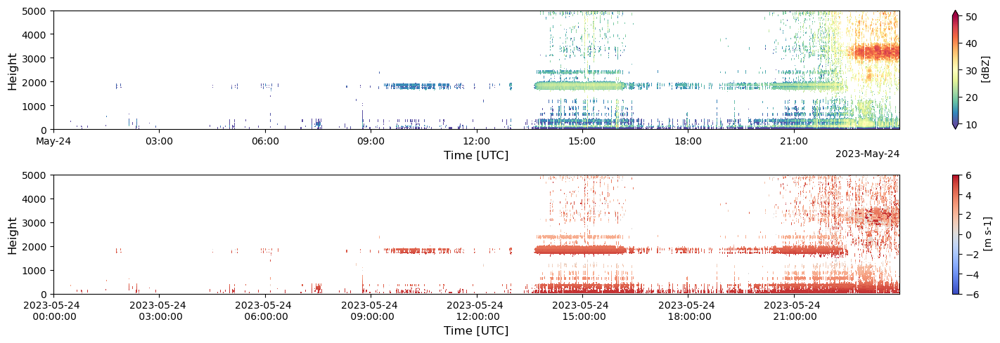

In [125]:
fig, ax = plt.subplots(2, 1, figsize=(16, 5))
ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 5000)
ds["VEL"].T.plot(cmap='coolwarm', vmin=-6, vmax=6, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('May 24th.png', dpi=300, bbox_inches='tight')

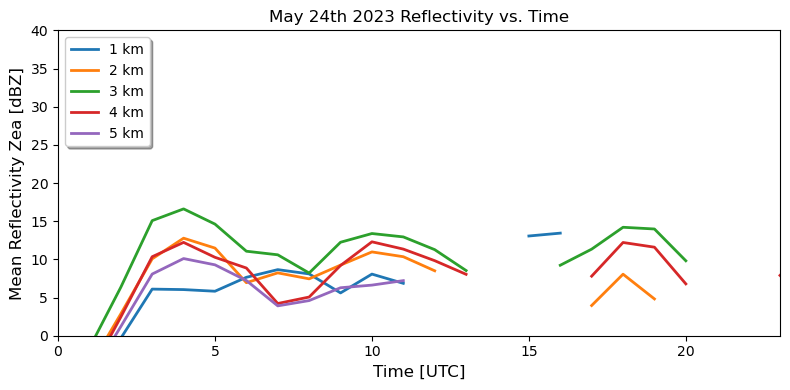

In [129]:
fig, ax = plt.subplots(figsize=(8, 4))

isel_time = [0, 1, 2]
isel_range = [1000, 2000, 3000]

sst_mm.sel(hour=23, method='nearest', range=isel_range)
ds["Zea"].isel(time=isel_time),ax.plot(sst_mm[1], linewidth=2),ax.plot(sst_mm[2], linewidth=2), ax.plot(sst_mm[3], linewidth=2), ax.plot(sst_mm[4], linewidth=2), ax.plot(sst_mm[5], linewidth=2)

plt.xlabel('Time [UTC]', fontsize=12)
plt.xlim(0, 23)
plt.ylim(0,40)
plt.title('May 24th 2023 Reflectivity vs. Time', fontsize=12)
plt.ylabel('Mean Reflectivity Zea [dBZ]', fontsize=12)
ax.legend(['1 km', '2 km', '3 km', '4 km', '5 km'], loc='upper left', shadow=True)
# Show

fig.tight_layout()
plt.savefig('May 24th Hourly Reflectivity.png', dpi=300, bbox_inches='tight')

In [ ]:
#Different types of plots

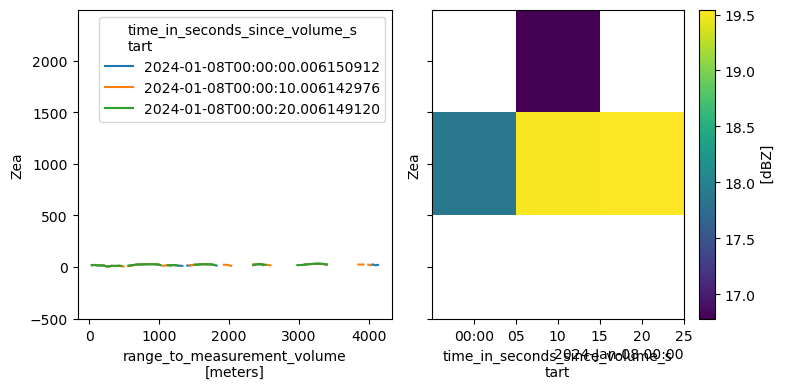

In [73]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharey=True)

isel_time = [0, 1, 2]
isel_range = [0, 1000, 2000]

ds["Zea"].isel( time=isel_time).plot(ax=ax1, hue='time')
ax1.set_ylabel('Zea')

# Temperature vs time plot - illustrates the "x" and "add_legend" kwargs
ds["Zea"].isel( time=isel_time).sel(range=isel_range, method="nearest").plot(ax=ax2, x='time')
ax2.set_ylabel('Zea')

# Show
plt.tight_layout()
plt.show()

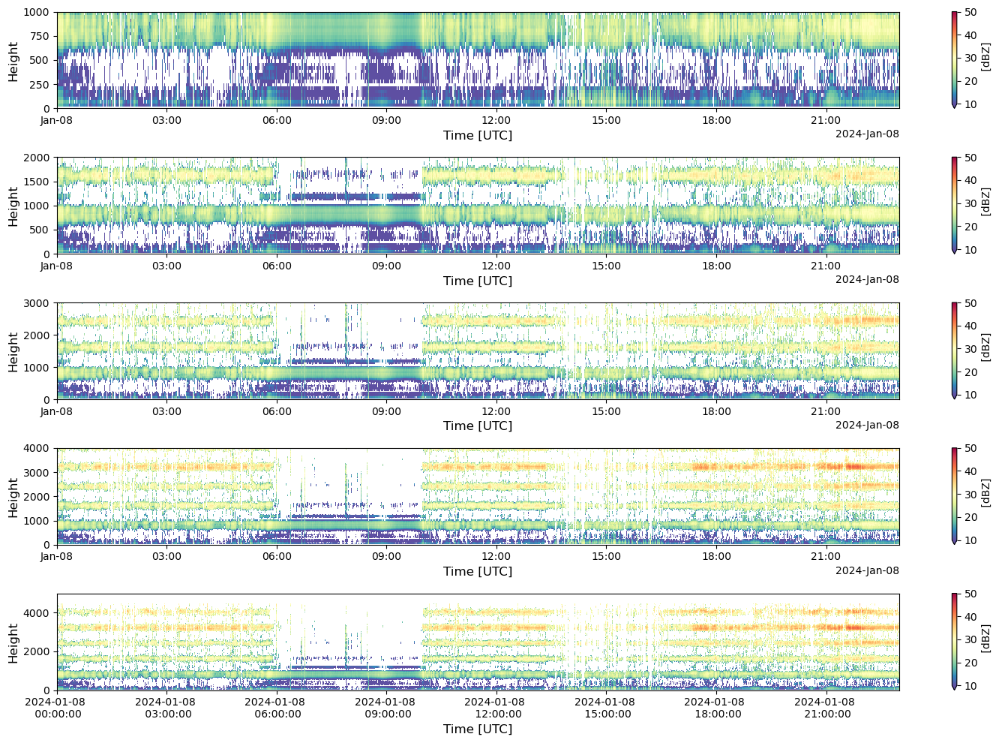

In [14]:
fig, ax = plt.subplots(5, 1, figsize=(15, 10))
sst_mm.sel(hour=23, range=128, method='nearest'),ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[0])
ax[0].set_xlabel('Time [UTC]', fontsize=12), ax[0].set_ylabel('Height', fontsize=12)
ax[0].set_ylim(0, 1000)
sst_mm.sel(hour=23, range=128, method='nearest'),ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[1])
ax[1].set_xlabel('Time [UTC]', fontsize=12), ax[1].set_ylabel('Height', fontsize=12)
ax[1].set_ylim(0, 2000)
sst_mm.sel(hour=23, range=128, method='nearest'),ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[2])
ax[2].set_xlabel('Time [UTC]', fontsize=12), ax[2].set_ylabel('Height', fontsize=12)
ax[2].set_ylim(0, 3000)
sst_mm.sel(hour=23, range=128, method='nearest'),ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[3])
ax[3].set_xlabel('Time [UTC]', fontsize=12), ax[3].set_ylabel('Height', fontsize=12)
ax[3].set_ylim(0, 4000)
sst_mm.sel(hour=23, range=128, method='nearest'),ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50, ax=ax[4])
ax[4].set_xlabel('Time [UTC]', fontsize=12), ax[4].set_ylabel('Height', fontsize=12)
ax[4].set_ylim(0, 5000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('January 8th.png', dpi=300, bbox_inches='tight')

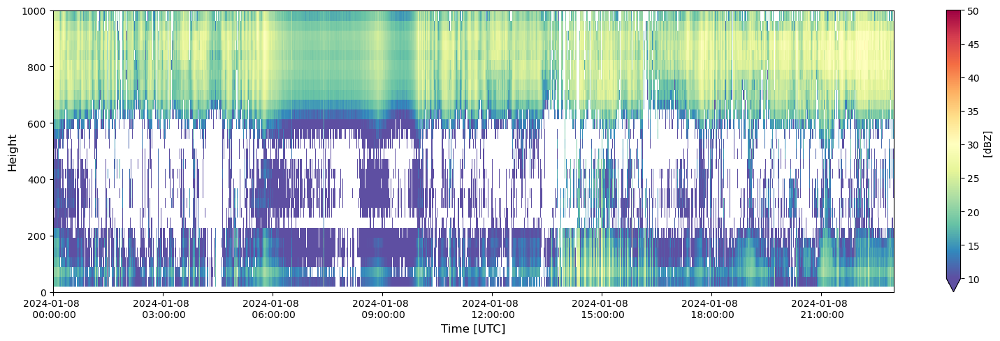

In [12]:
fig = plt.figure(figsize=(16, 5))
sst_mm.sel(hour=23, range=128, method='nearest'),ds["Zea"].T.plot(cmap='Spectral_r', vmin=10, vmax=50)
plt.xlabel('Time [UTC]', fontsize=12), plt.ylabel('Height', fontsize=12)
plt.ylim(0, 1000)
date_form = DateFormatter("%Y-%m-%d \n %H:%M:%S")
plt.gca().xaxis.set_major_formatter(date_form)
fig.tight_layout()
#plt.savefig('January 8th.png', dpi=300, bbox_inches='tight')

In [ ]:
#ds['spectrum_reflectivity'].sel(time='2024-01-09T00:11:00').plot(cmap='Spectral_r', vmin=-60, vmax=0)

In [ ]:
#ds['snr_spectrum'] = 10**(ds['spectrum_reflectivity']/10) / 10**(ds['spectrum_reflectivity'].median(dim='spectrum_n_samples_extended')/10)
#ds['snr_spectrum'] = 10 * np.log10(ds['snr_spectrum'])
#ds['snr_spectrum'].sel(time='2024-01-09T00:11:00').plot(cmap='ChaseSpectral', vmin=-30, vmax=20)